In [109]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.base import BaseEstimator, RegressorMixin, TransformerMixin
from sklearn.pipeline import Pipeline
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import MinMaxScaler
import math
from sklearn.metrics import mean_squared_error
from keras.layers.core import Dense, Activation, Dropout, RepeatVector
from keras.layers.recurrent import LSTM
from keras.models import Sequential
import time
from sklearn.preprocessing import StandardScaler

In [6]:
cols =['time',
 'loc_cell_name',
 'no_records',
 'unique_users',
 'unique_active_users_dl',
 'unique_active_users_ul',
 'active_traf_records_dl',
 'active_traf_records_ul',
 'sum_btraf_bearer_bytes_dl',
 'sum_btraf_bearer_bytes_ul',
 'sum_btraf_samples',
 'sum_kpi_core_create_pdp_new_ip_samples',
 'mean_kpi_core_create_pdp_new_ip_val',
 'sum_kpi_core_create_pdp_response_time_samples',
 'mean_kpi_core_create_pdp_response_time_val',
 'sum_kpi_core_create_pdp_same_ip_samples',
 'mean_kpi_core_create_pdp_same_ip_val',
 'sum_kpi_core_create_session_new_ip_samples',
 'mean_kpi_core_create_session_new_ip_val',
 'sum_kpi_core_create_session_response_time_samples',
 'mean_kpi_core_create_session_response_time_val',
 'sum_kpi_core_create_session_same_ip_samples',
 'mean_kpi_core_create_session_same_ip_val',
 'sum_kpi_core_delete_bearer_response_time_samples',
 'mean_kpi_core_delete_bearer_response_time_val',
 'sum_kpi_core_delete_pdp_response_time_samples',
 'mean_kpi_core_delete_pdp_response_time_val',
 'sum_kpi_core_delete_pdp_success_samples',
 'mean_kpi_core_delete_pdp_success_val',
 'sum_kpi_core_delete_session_response_time_samples',
 'mean_kpi_core_delete_session_response_time_val',
 'sum_kpi_core_gtpc_delete_bearer_samples',
 'mean_kpi_core_gtpc_delete_bearer_val',
 'sum_kpi_core_gtpc_delete_session_samples',
 'mean_kpi_core_gtpc_delete_session_val',
 'sum_kpi_core_gtpc_modify_bearer_samples',
 'mean_kpi_core_gtpc_modify_bearer_val',
 'sum_kpi_core_gtpc_update_bearer_samples',
 'mean_kpi_core_gtpc_update_bearer_val',
 'sum_kpi_core_modify_bearer_response_time_samples',
 'mean_kpi_core_modify_bearer_response_time_val',
 'sum_kpi_core_s1_ho_attempts_samples',
 'mean_kpi_core_s1_ho_attempts_val',
 'sum_kpi_core_s1_ho_samples',
 'mean_kpi_core_s1_ho_val',
 'sum_kpi_core_update_bearer_response_time_samples',
 'mean_kpi_core_update_bearer_response_time_val',
 'sum_kpi_core_update_pdp_response_time_samples',
 'mean_kpi_core_update_pdp_response_time_val',
 'sum_kpi_core_update_pdp_success_samples',
 'mean_kpi_core_update_pdp_success_val',
 'sum_kpi_core_x2_ho_attempts_samples',
 'mean_kpi_core_x2_ho_attempts_val',
 'sum_kpi_core_x2_ho_samples',
 'mean_kpi_core_x2_ho_val',
 'sum_kpi_ran_abnormal_lte_conn_rel_ratio_samples',
 'mean_kpi_ran_abnormal_lte_conn_rel_ratio_val',
 'sum_kpi_ran_cqi_samples',
 'mean_kpi_ran_cqi_val',
 'sum_kpi_ran_dl_credits_samples',
 'mean_kpi_ran_dl_credits_val',
 'sum_kpi_ran_dl_non_hs_tx_power_samples',
 'mean_kpi_ran_dl_non_hs_tx_power_val',
 'sum_kpi_ran_ecn0_samples',
 'mean_kpi_ran_ecn0_val',
 'sum_kpi_ran_harq_loss_dl_samples',
 'mean_kpi_ran_harq_loss_dl_val',
 'sum_kpi_ran_harq_loss_ul_samples',
 'mean_kpi_ran_harq_loss_ul_val',
 'sum_kpi_ran_hs_ho_samples',
 'mean_kpi_ran_hs_ho_val',
 'sum_kpi_ran_n_hsusers_samples',
 'mean_kpi_ran_n_hsusers_val',
 'sum_kpi_ran_n_ps_drop_samples',
 'mean_kpi_ran_n_ps_drop_val',
 'sum_kpi_ran_n_voice_drop_samples',
 'mean_kpi_ran_n_voice_drop_val',
 'sum_kpi_ran_neighbor_rsrp_samples',
 'mean_kpi_ran_neighbor_rsrp_val',
 'sum_kpi_ran_neighbor_rsrq_samples',
 'mean_kpi_ran_neighbor_rsrq_val',
 'sum_kpi_ran_pdcp_tp_dl_samples',
 'mean_kpi_ran_pdcp_tp_dl_val',
 'sum_kpi_ran_pdcp_tp_ul_samples',
 'mean_kpi_ran_pdcp_tp_ul_val',
 'sum_kpi_ran_per_active_ue_dl_mean_samples',
 'mean_kpi_ran_per_active_ue_dl_mean_val',
 'sum_kpi_ran_per_active_ue_ul_mean_samples',
 'mean_kpi_ran_per_active_ue_ul_mean_val',
 'sum_kpi_ran_rlc_loss_dl_samples',
 'mean_kpi_ran_rlc_loss_dl_val',
 'sum_kpi_ran_rlc_loss_ul_samples',
 'mean_kpi_ran_rlc_loss_ul_val',
 'sum_kpi_ran_rscp_samples',
 'mean_kpi_ran_rscp_val',
 'sum_kpi_ran_rsrp_samples',
 'mean_kpi_ran_rsrp_val',
 'sum_kpi_ran_rsrq_samples',
 'mean_kpi_ran_rsrq_val',
 'sum_kpi_ran_s1_ho_exec_time_samples',
 'mean_kpi_ran_s1_ho_exec_time_val',
 'sum_kpi_ran_serving_rsrp_samples',
 'mean_kpi_ran_serving_rsrp_val',
 'sum_kpi_ran_serving_rsrq_samples',
 'mean_kpi_ran_serving_rsrq_val',
 'sum_kpi_ran_ul_credits_samples',
 'mean_kpi_ran_ul_credits_val',
 'sum_kpi_ran_ul_interference_samples',
 'mean_kpi_ran_ul_interference_val',
 'sum_kpi_ran_x2_ho_exec_time_samples',
 'mean_kpi_ran_x2_ho_exec_time_val',
 'sum_kpi_volte_csfb_call_setup_time_samples',
 'mean_kpi_volte_csfb_call_setup_time_val',
 'sum_kpi_volte_csfb_call_succ_samples',
 'mean_kpi_volte_csfb_call_succ_val',
 'sum_kpi_volte_n_csfb_call_attempt_samples',
 'mean_kpi_volte_n_csfb_call_attempt_val',
 'sum_kpi_volte_srvcc_attempts_samples',
 'mean_kpi_volte_srvcc_attempts_val',
 'sum_kpi_volte_srvcc_succ_ratio_samples',
 'mean_kpi_volte_srvcc_succ_ratio_val',
 'mean_mobility_avg_time_per_cell',
 'mean_mobility_no_2G_cells',
 'mean_mobility_no_3G_cells',
 'mean_mobility_no_4G_cells',
 'mean_mobility_no_handovers',
 'mean_mobility_no_unique_cells',
 'sum_traf_adjust_advertisement_bytes_dl',
 'sum_traf_adjust_advertisement_bytes_ul',
 'mean_traf_adjust_advertisement_pkt_loss_net',
 'mean_traf_adjust_advertisement_pkt_loss_net_dl',
 'mean_traf_adjust_advertisement_pkt_loss_term',
 'mean_traf_adjust_advertisement_pkt_loss_term_dl',
 'mean_traf_adjust_advertisement_rtt_net',
 'mean_traf_adjust_advertisement_rtt_term',
 'sum_traf_adjust_advertisement_samples',
 'sum_traf_adjust_advertisement_tcp_bytes_dl',
 'sum_traf_adjust_advertisement_tcp_bytes_ul',
 'mean_traf_adjust_advertisement_tcp_rwin_max']
df = pd.read_csv("/home/esihakh/projects/peak_data/0717-1016/area_jewish_south_0831-1016.csv",usecols=cols)

In [7]:
df.head()

,time,loc_cell_name,no_records,unique_users,unique_active_users_dl,unique_active_users_ul,active_traf_records_dl,active_traf_records_ul,sum_btraf_bearer_bytes_dl,sum_btraf_bearer_bytes_ul,...,mean_traf_adjust_advertisement_pkt_loss_net,mean_traf_adjust_advertisement_pkt_loss_net_dl,mean_traf_adjust_advertisement_pkt_loss_term,mean_traf_adjust_advertisement_pkt_loss_term_dl,mean_traf_adjust_advertisement_rtt_net,mean_traf_adjust_advertisement_rtt_term,sum_traf_adjust_advertisement_samples,sum_traf_adjust_advertisement_tcp_bytes_dl,sum_traf_adjust_advertisement_tcp_bytes_ul,mean_traf_adjust_advertisement_tcp_rwin_max
0,2016-08-31T14:20:00.000+02:00,lacsac_1200_34034,15,5,1,1,3,3,624390.0,116331.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2016-08-31T13:00:00.000+02:00,lacsac_1200_34034,31,9,1,1,3,3,34803.0,13812.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2016-08-31T15:25:00.000+02:00,lacsac_1200_34034,8,6,1,1,1,1,224394.0,26458.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2016-08-31T14:45:00.000+02:00,lacsac_1200_34034,33,10,2,2,6,6,26424.0,36324.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2016-08-31T22:50:00.000+02:00,lacsac_1200_34034,1,1,0,0,0,0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [8]:
df.tail()

,time,loc_cell_name,no_records,unique_users,unique_active_users_dl,unique_active_users_ul,active_traf_records_dl,active_traf_records_ul,sum_btraf_bearer_bytes_dl,sum_btraf_bearer_bytes_ul,...,mean_traf_adjust_advertisement_pkt_loss_net,mean_traf_adjust_advertisement_pkt_loss_net_dl,mean_traf_adjust_advertisement_pkt_loss_term,mean_traf_adjust_advertisement_pkt_loss_term_dl,mean_traf_adjust_advertisement_rtt_net,mean_traf_adjust_advertisement_rtt_term,sum_traf_adjust_advertisement_samples,sum_traf_adjust_advertisement_tcp_bytes_dl,sum_traf_adjust_advertisement_tcp_bytes_ul,mean_traf_adjust_advertisement_tcp_rwin_max
685285,2016-10-16T00:15:00.000+02:00,lacsac_1200_45574,1,1,0,0,0,0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
685286,2016-10-16T21:55:00.000+02:00,lacsac_1200_45574,1,1,0,0,0,0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
685287,2016-10-16T11:30:00.000+02:00,lacsac_1200_45574,1,1,0,0,0,0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
685288,2016-10-16T21:15:00.000+02:00,lacsac_1200_45694,1,1,0,0,0,0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
685289,2016-10-16T11:35:00.000+02:00,lacsac_1200_44180,1,1,0,0,0,0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [9]:
print "num cells: %d"%(df.loc_cell_name.unique().shape)
df.count()

num cells: 87


time                                                 685290
loc_cell_name                                        685290
no_records                                           685290
unique_users                                         685290
unique_active_users_dl                               685290
unique_active_users_ul                               685290
active_traf_records_dl                               685290
active_traf_records_ul                               685290
sum_btraf_bearer_bytes_dl                            485692
sum_btraf_bearer_bytes_ul                            485692
sum_btraf_samples                                    485692
sum_kpi_core_create_pdp_new_ip_samples               156885
mean_kpi_core_create_pdp_new_ip_val                  156885
sum_kpi_core_create_pdp_response_time_samples        166329
mean_kpi_core_create_pdp_response_time_val           166329
sum_kpi_core_create_pdp_same_ip_samples               13745
mean_kpi_core_create_pdp_same_ip_val    

In [10]:
# # print number of cells
# print "num cells: %d"%(df.loc_cell_name.unique().shape)

# # select top n cells
# n = 87
# top_n_cells = df.groupby(['loc_cell_name'],sort=False)['unique_users'].count().sort_values(ascending = False)[:n,]

# # create list of top n cells.
# top_n_cell_list =[]
# for i,row in top_n_cells.iteritems():
#     top_n_cell_list.append(i)
# print top_n_cell_list

In [11]:
df = df.drop('loc_cell_name', 1)


In [12]:
df=df.dropna(axis=1,how='all')


In [13]:
class SetColAsIndex(TransformerMixin):
    def __init__(self, col):
        self.col = col

    def transform(self, X, **transform_params):
        X.index = X.loc[:, self.col].apply(lambda x: pd.to_datetime(x))
        return X

    def fit(self, X, y=None, **fit_params):
        return self


class FilterCompleteDays(TransformerMixin):
    def __init__(self, n=96):
        self.n = n

    def transform(self, X, **transform_params):
        #print X.groupby(X.index.date).transform('count')
        X = X.ix[X.groupby(X.index.date).transform('count').iloc[:, 0] >= self.n]
        return X

    def fit(self, X, y=None, **fit_params):
        return self

class FilterDays(TransformerMixin):
    def __init__(self, days=None):
        self.days = days

    def transform(self, X, **transform_params):
        X = X.iloc[pd.Series(X.index.day).isin(self.days).values, :]
        return X

    def fit(self, X, y=None, **fit_params):
        return self


class FilterWeekEnd(TransformerMixin):
    def transform(self, X, **transform_params):
        X = X[X.index.weekday > 4]
        return X

    def fit(self, X, y=None, **fit_params):
        return self


class SortTimeSeries(TransformerMixin):
    def transform(self, X, **transform_params):
        X = X.sort_index()
        return X

    def fit(self, X, y=None, **fit_params):
        return self


class RemoveDuplicateRow(TransformerMixin):
    def __init__(self, sample_period):
        self.sample_period = sample_period

    def transform(self, X, **transform_params):
        X = X.resample(self.sample_period, 'mean').fillna(method='bfill')
        return X

    def fit(self, X, y=None, **fit_params):
        return self

In [14]:
process_pipeline = make_pipeline(SetColAsIndex('time'),FilterCompleteDays(96),
                                SortTimeSeries())
df = process_pipeline.fit_transform(df)
df = df.drop('time', 1)

In [15]:
# combine timeseries of different cells
df = df.groupby(df.index).sum()

In [16]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 10938 entries, 2016-08-31 07:45:00 to 2016-10-16 22:00:00
Columns: 137 entries, no_records to mean_traf_adjust_advertisement_tcp_rwin_max
dtypes: float64(131), int64(6)
memory usage: 11.5 MB


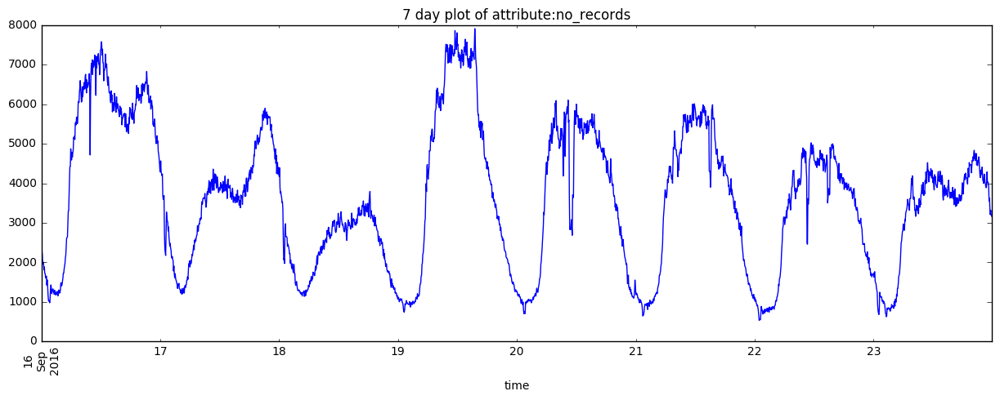

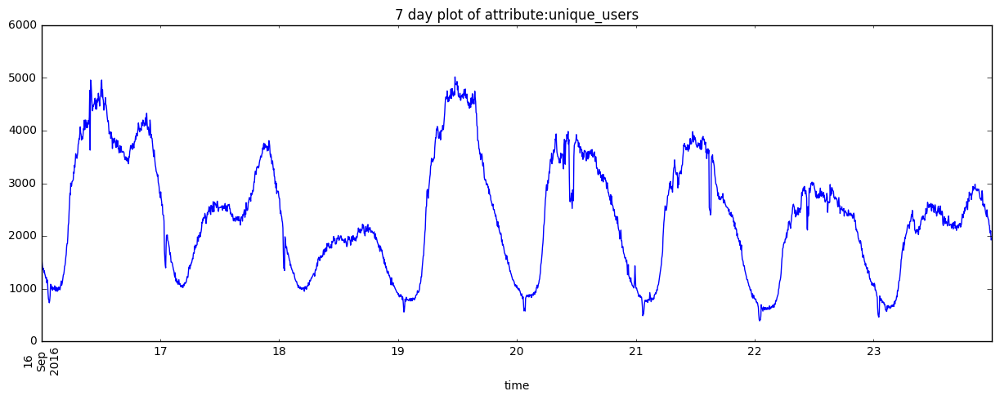

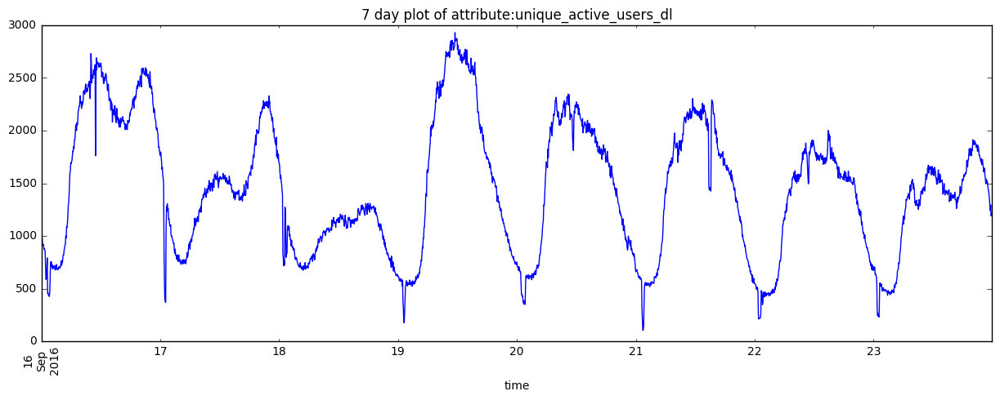

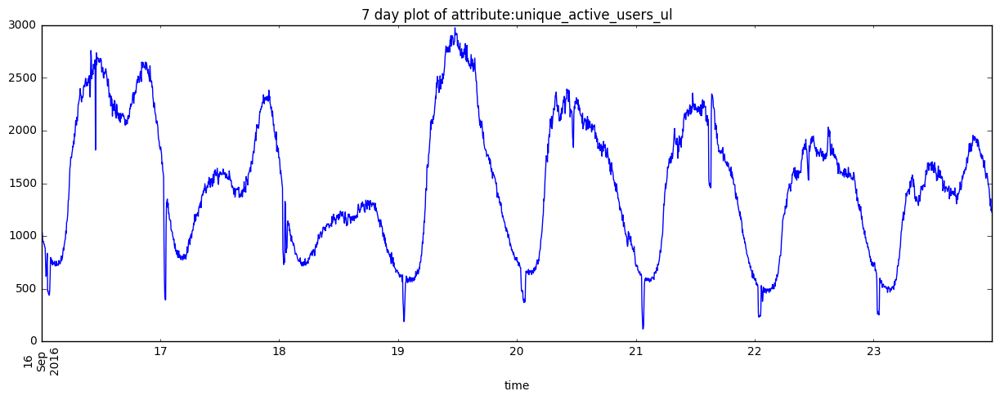

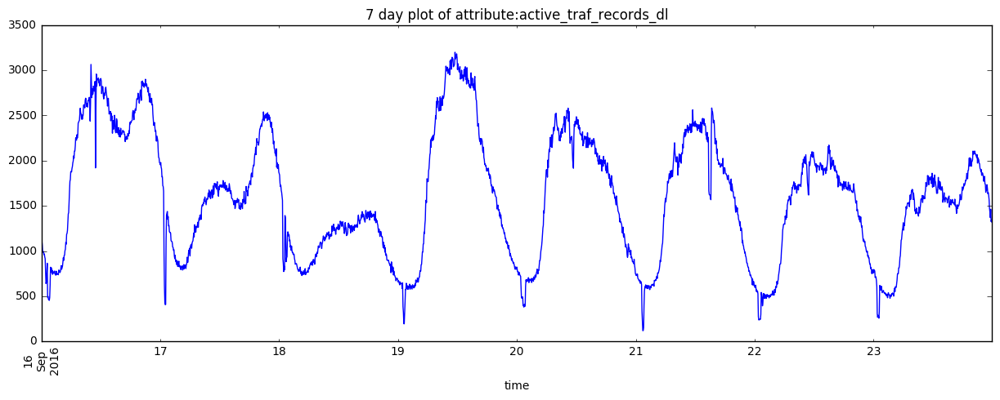

...

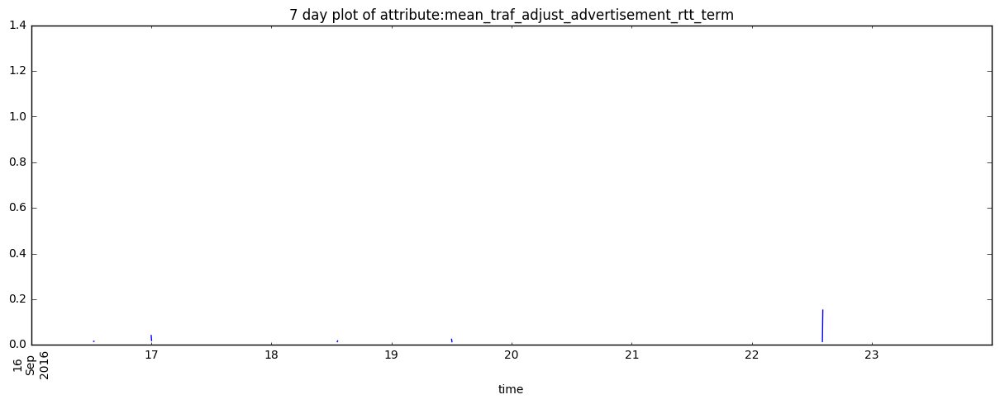

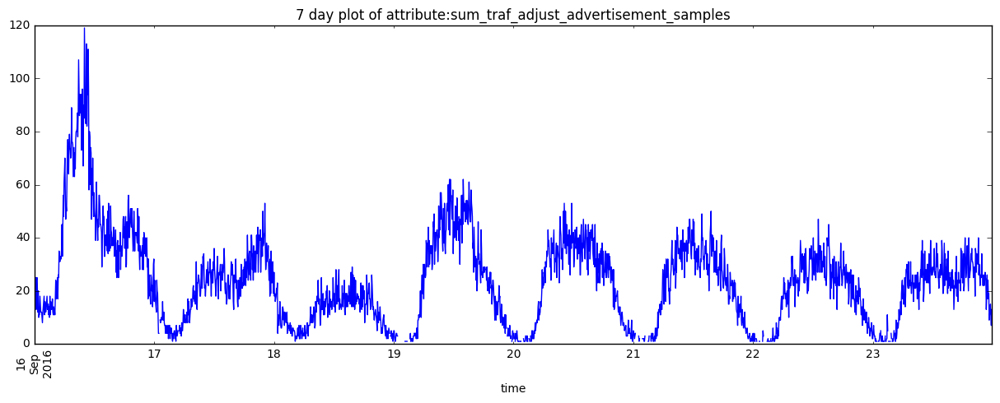

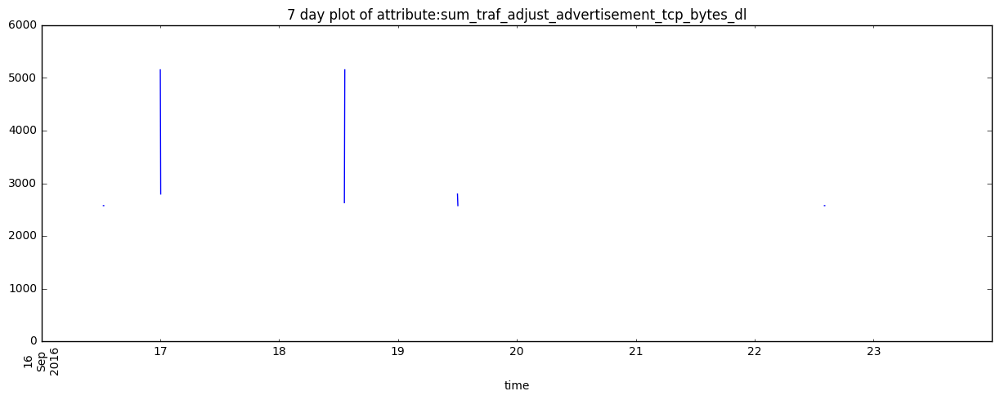

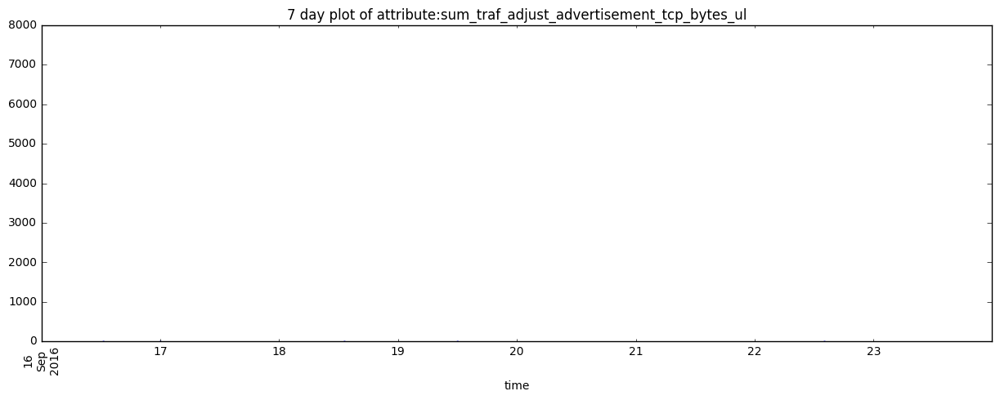

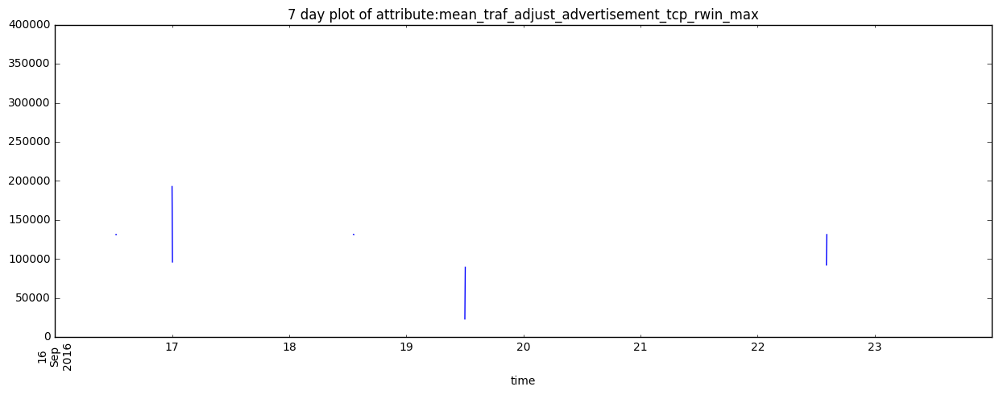

In [17]:
#plot 2 days data
df_2day = df['2016-09-16':'2016-09-23']
for col in df_2day:
    df_2day[col].plot(figsize=(15,5))
    plt.xticks(rotation='vertical')
    plt.title("7 day plot of attribute:"+ col)
    plt.show()

In [ ]:
#select features
features = ['unique_users','unique_active_users_dl','unique_active_users_ul','active_traf_records_dl',
 'active_traf_records_ul','sum_btraf_bearer_bytes_dl',
 'sum_btraf_bearer_bytes_ul','sum_kpi_core_create_pdp_response_time_samples',
 'sum_kpi_core_create_pdp_same_ip_samples',
 'sum_kpi_core_create_session_new_ip_samples',
 'mean_kpi_core_create_session_response_time_samples',
 'sum_kpi_core_create_session_same_ip_samples',
 'mean_kpi_core_modify_bearer_response_time_val',
  'sum_kpi_core_s1_ho_attempts_samples',
 'mean_kpi_core_s1_ho_attempts_val',
 'sum_kpi_core_s1_ho_samples',          
'mean_kpi_ran_abnormal_lte_conn_rel_ratio_val'       
 'mean_kpi_ran_cqi_val',
  'sum_kpi_ran_dl_credits_samples',
            'sum_kpi_ran_dl_non_hs_tx_power_samples',
            'mean_kpi_ran_ecn0_val',
            'mean_kpi_ran_per_active_ue_dl_mean_val'
           ]
df =df.ix[:,features]
print df.head(5)
print df.tail(5)

In [ ]:
df =df.fillna(0)
df.sum(axis=0)

In [ ]:
np.save("../resources/data/peak_multi_kpis_Aug31_Oct16",df)

In [4]:
dataset = np.load("../resources/data/peak_multi_kpis_Aug31_Oct16.npy")

NameError: name 'np' is not defined

In [118]:
print dataset[:10,:]

[[  2.70900000e+03   1.32000000e+03   1.36000000e+03   1.38800000e+03
    1.38800000e+03   1.93834178e+09   1.31526698e+08   3.10000000e+01
    2.00000000e+00   2.90000000e+01   0.00000000e+00   1.03000000e+02
    3.09773497e-02   1.00000000e+00   1.00000000e+00   1.00000000e+00
    0.00000000e+00   6.05000000e+02   6.05000000e+02  -3.20122313e+01
    0.00000000e+00]
 [  2.94000000e+03   1.35900000e+03   1.40400000e+03   1.50300000e+03
    1.50300000e+03   1.02710936e+09   1.19271746e+08   4.10000000e+01
    4.00000000e+00   3.50000000e+01   0.00000000e+00   1.60000000e+02
    2.47986827e-02   1.10000000e+01   5.00000000e+00   1.10000000e+01
    0.00000000e+00   1.03600000e+03   1.03600000e+03  -3.33480704e+01
    0.00000000e+00]
 [  3.18500000e+03   1.43800000e+03   1.48000000e+03   1.58600000e+03
    1.58600000e+03   9.14181455e+08   6.88171020e+07   3.00000000e+01
    3.00000000e+00   3.90000000e+01   0.00000000e+00   1.97000000e+02
    2.73092913e-02   9.00000000e+00   8.00000000e+

In [2]:
#use only for training data
#use returned scaler object to scale test data
def standardize(data):
    print data.shape
    scaler = StandardScaler()
    data = scaler.fit_transform(data)
    print "Scaler Mean: %s" % (scaler.mean_)
    print "Scaler Variance: %s" % (scaler.var_)
    return data,scaler

def prepare_seq2seq_data(dataset, look_back, look_ahead):
    dataX, dataY = [], []
    for i in range(len(dataset) - look_back - look_ahead):
        input_seq = dataset[i:(i + look_back), :]
        output_seq = dataset[i + look_back:(i + look_back + look_ahead), :1]
        dataX.append(input_seq)
        dataY.append(output_seq)
    dataX = np.array(dataX)
    dataY = np.array(dataY)
    return dataX,dataY

def get_peak_data(dataset,look_back,look_ahead,train_test_ratio = 0.7):
    #dataset = np.load("../resources/data/peak_multi_kpis_Aug31_Oct16.npy")
    train_size = int(len(dataset) * train_test_ratio)
    train, test = dataset[0:train_size, :], dataset[train_size:len(dataset), :]
    train,scaler = standardize(train)
    test = scaler.transform(test)
    trainX, trainY = prepare_seq2seq_data(train,look_back,look_ahead)
    testX, testY = prepare_seq2seq_data(test,look_back,look_ahead)
    return trainX, trainY, testX, testY,scaler



In [3]:
trainX, trainY, testX,testY,scaler = get_peak_data(dataset,0.7)

NameError: name 'dataset' is not defined

(7656, 21)
Scaler Mean: [  2.22350993e+03   1.33100758e+03   1.37285057e+03   1.49832275e+03
   1.49832275e+03   7.24593701e+08   8.49300017e+07   2.28838819e+01
   1.37813480e+00   3.42176071e+01   0.00000000e+00   1.10349399e+02
   2.45747892e-02   6.98158307e+00   3.26680181e+00   6.92672414e+00
   0.00000000e+00   7.60183516e+02   7.60179598e+02  -2.88764827e+01
   0.00000000e+00]
Scaler Variance: [  1.23057833e+06   4.37534132e+05   4.43405220e+05   6.27348248e+05
   6.27348248e+05   2.23473469e+17   4.60302632e+15   3.03886334e+02
   7.84852400e+00   4.91027099e+02   0.00000000e+00   8.27731588e+03
   3.05169895e-02   1.40618130e+02   1.13301091e+01   1.38498419e+02
   0.00000000e+00   2.04301965e+05   2.04283788e+05   2.57196561e+01
   0.00000000e+00]


In [130]:
print trainX.shape
print trainY.shape

(7642, 10, 21)
(7642, 4, 1)


In [131]:
print trainX[3]

[[  8.80264529e-01   1.34538651e-01   1.33880753e-01   1.04383453e-01
    1.04383453e-01   1.59635479e-01  -2.26495812e-01   1.32604823e+00
    9.35871807e-01   3.06076660e-01   0.00000000e+00   1.16125396e+00
    2.33693471e-02   9.29177196e-01   2.04278339e+00   9.40922193e-01
    0.00000000e+00   5.48269288e-01   5.48302349e-01  -5.26242456e-01
    0.00000000e+00]
 [  9.21731585e-01   1.60239233e-01   1.90947511e-01   1.53622571e-01
    1.53622571e-01   2.38720951e-01   1.28414404e+00   9.24495616e-01
   -1.34974786e-01  -3.25717061e-01   0.00000000e+00   9.74399200e-01
    2.44862344e-02   3.38870946e-01   1.10908288e+00   3.46115793e-01
    0.00000000e+00   4.33224467e-01   4.33252410e-01  -6.07346299e-01
    0.00000000e+00]
 [  7.82907094e-01   1.25467857e-01   1.24870213e-01   7.02948333e-02
    7.02948333e-02   7.41252449e-01   1.77555586e+00   6.37672321e-01
    2.21974078e-01   1.25564169e-01   0.00000000e+00   1.06233085e+00
    1.34109504e-02  -1.67105839e-01   2.17823302e-

In [132]:
print trainY[0:1]


[[[ 0.91001263]
  [ 0.91542138]
  [ 0.88477182]
  [ 0.93345054]]]


In [133]:
layers={'input': 21, 'hidden1': 100, 'hidden2': 500, 'hidden3': 100, 'hidden4':30 ,'output': 1}
n_hidden=3
dropout = 0.4
optimizer = 'rmsprop'
loss = 'mse'

In [134]:
model = Sequential()
model.add(LSTM(
            input_length=look_back,
            input_dim=layers['input'],
            output_dim=layers['hidden1'],
            return_sequences=True))
model.add(Dropout(dropout))

#add hidden layers
for i in range(2,n_hidden+1):
    return_sequences = True
    if i == n_hidden:
        return_sequences = False
    model.add(LSTM(layers["hidden"+str(i)],return_sequences=return_sequences))
    model.add(Dropout(dropout))

#add dense layer with output dimension to get output for one time_step
model.add(Dense(output_dim=layers['output']))

#Repeat for look_ahead steps to get outputs for look_ahead timesteps.
model.add(RepeatVector(look_ahead))

#add activation
model.add(Activation("linear"))

# compile model and print summary
start = time.time()
model.compile(loss=loss, optimizer=optimizer)
model.summary()

____________________________________________________________________________________________________
Layer (type)                     Output Shape          Param #     Connected to                     
lstm_32 (LSTM)                   (None, 10, 100)       48800       lstm_input_15[0][0]              
____________________________________________________________________________________________________
dropout_27 (Dropout)             (None, 10, 100)       0           lstm_32[0][0]                    
____________________________________________________________________________________________________
lstm_33 (LSTM)                   (None, 10, 500)       1202000     dropout_27[0][0]                 
____________________________________________________________________________________________________
dropout_28 (Dropout)             (None, 10, 500)       0           lstm_33[0][0]                    
___________________________________________________________________________________________

In [135]:
model.fit(trainX, trainY,batch_size=1024, nb_epoch=5, validation_split=0.05,shuffle=False,verbose=2)


Train on 7259 samples, validate on 383 samples
Epoch 1/5
59s - loss: 1.1022 - val_loss: 0.3734
Epoch 2/5
51s - loss: 0.3449 - val_loss: 0.1127
Epoch 3/5
33s - loss: 0.3357 - val_loss: 0.3374
Epoch 4/5
32s - loss: 0.3233 - val_loss: 0.1401
Epoch 5/5
45s - loss: 0.2717 - val_loss: 0.2900


In [136]:
model.evaluate(testX, testY, batch_size=1024, verbose=2)

0.30670556017497469

In [137]:
testPredictions = model.predict(testX)
print testPredictions.shape
print testPredictions[:5]
print testPredictions[:,0,0]

(3268, 4, 1)
[[[-0.52118182]
  [-0.52118182]
  [-0.52118182]
  [-0.52118182]]

 [[-0.53343415]
  [-0.53343415]
  [-0.53343415]
  [-0.53343415]]

 [[-0.54755545]
  [-0.54755545]
  [-0.54755545]
  [-0.54755545]]

 [[-0.57063389]
  [-0.57063389]
  [-0.57063389]
  [-0.57063389]]

 [[-0.66037357]
  [-0.66037357]
  [-0.66037357]
  [-0.66037357]]]
[-0.52118182 -0.53343415 -0.54755545 ..., -0.32411608 -0.34617379
 -0.34865272]


In [138]:
testY_1 = testY[:, 0]
testY_1 = testY_1.flatten()
print testY_1[:5]

[-1.05877106 -1.09663228 -1.11195706 -1.10835123 -1.15432558]


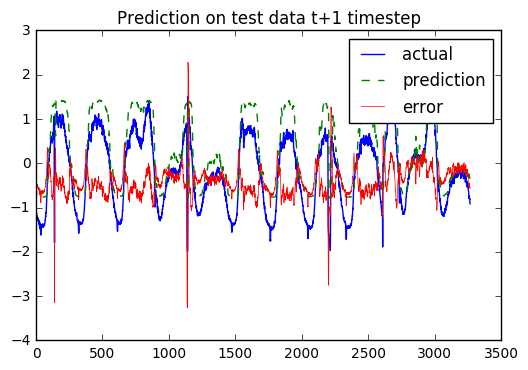

In [139]:
plt.title("Prediction on test data t+1 timestep")
plt.plot(testY_1,label = "actual",linewidth=1)
plt.plot(testPredictions[:,0,0],label = "prediction",linewidth=1,linestyle="--")
error = ((testY_1 - testPredictions[:,0,0]))
plt.plot(error, label = "error",linewidth=0.5)
plt.legend()
plt.show()